<h1>Imports and Loading Datasets</h1>

In [3]:
import random

import kagglehub
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, mean_absolute_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, root_mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import matplotlib.pyplot as plt

from sklearn.inspection import DecisionBoundaryDisplay

from tabulate import tabulate



In [4]:
# Download latest version
path = kagglehub.dataset_download("ruchikakumbhar/obesity-prediction")

print("Path to dataset files:", path)
df = pd.read_csv(path + "/Obesity Prediction.csv")
df.head()
original_df = df.copy()

Path to dataset files: /Users/hendrata/.cache/kagglehub/datasets/ruchikakumbhar/obesity-prediction/versions/1


<h1>Data Transformations</h1>

Transforming categories into categoricals and ordinals

In [5]:
df = original_df.copy()
print("df shape: ", df.shape)

def updateCol(df):
    # Data massaging:
    # Gender: 0 = Female, 1 = Male
    df['Gender'] = df['Gender'].map({'Female': 0, 'Male': 1})

    # Family history, FAVC, SMOKE, SCC: 0 = no, 1 = yes
    yes_no_columns = ['family_history', 'FAVC', 'SMOKE', 'SCC']
    for col in yes_no_columns:
        df[col] = df[col].map({'no': 0, 'yes': 1})

    # CAEC, CALC: 0 = no, 1 = Sometimes, 2 = Frequently, 3 = Always
    frequency_columns = ['CAEC', 'CALC']
    for col in frequency_columns:
        df[col] = df[col].map({'no': 0, 'Sometimes': 1, 'Frequently': 2, 'Always': 3})

    # MTRANS: 0 = Public_Transportation, 1 = Walking, 2 = Automobile, 3 = Motorbike, 4 = Bike
    df['MTRANS'] = df['MTRANS'].map({'Public_Transportation': 0, 'Walking': 1, 'Automobile': 2, 'Motorbike': 3, 'Bike': 4})

    # Obesity
    df['Obesity'] = df['Obesity'].map({'Insufficient_Weight': 0, 'Normal_Weight': 1, 'Overweight_Level_I': 2,
                                    'Overweight_Level_II': 3, 'Obesity_Type_I': 4, 'Obesity_Type_II': 5,
                                    'Obesity_Type_III': 6})
    return df

df = updateCol(df)

# Now df should be all numeric
df.head()


df shape:  (2111, 17)


,Gender,Age,Height,Weight,family_history,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obesity
0,0,21.0,1.62,64.0,1,0,2.0,3.0,1,0,2.0,0,0.0,1.0,0,0,1
1,0,21.0,1.52,56.0,1,0,3.0,3.0,1,1,3.0,1,3.0,0.0,1,0,1
2,1,23.0,1.80,77.0,1,0,2.0,3.0,1,0,2.0,0,2.0,1.0,2,0,1
3,1,27.0,1.80,87.0,0,0,3.0,3.0,1,0,2.0,0,2.0,0.0,2,1,2
4,1,22.0,1.78,89.8,0,0,2.0,1.0,1,0,2.0,0,0.0,0.0,1,0,3


In [6]:
# Describe the data sets to get an insight
print(df.describe())

            Gender          Age       Height       Weight  family_history  \
count  2111.000000  2111.000000  2111.000000  2111.000000     2111.000000   
mean      0.505921    24.312600     1.701677    86.586058        0.817622   
std       0.500083     6.345968     0.093305    26.191172        0.386247   
min       0.000000    14.000000     1.450000    39.000000        0.000000   
25%       0.000000    19.947192     1.630000    65.473343        1.000000   
50%       1.000000    22.777890     1.700499    83.000000        1.000000   
75%       1.000000    26.000000     1.768464   107.430682        1.000000   
max       1.000000    61.000000     1.980000   173.000000        1.000000   

              FAVC         FCVC          NCP         CAEC        SMOKE  \
count  2111.000000  2111.000000  2111.000000  2111.000000  2111.000000   
mean      0.883941     2.419043     2.685628     1.140692     0.020843   
std       0.320371     0.533927     0.778039     0.468543     0.142893   
min       

<h1>Splitting dataset into training set and testing set</h1>

80 percent of datasets are used as training set

20 percent are used as testing set

The split is done randomly

In [7]:
print("df shape: ", df.shape)

def sampleData(df, col=False):
    random.seed(12345)
    target_column = "Obesity"

    if (col): 
        if col == 'both':
            y_data = df[target_column]
            x_data = df[['Weight', 'Height']]
        elif col != 'none':
            del df[col]
            y_data = df[target_column]
            x_data = df[df.columns[:-1]]
        else:
            y_data = df[target_column]
            x_data = df[df.columns[:-1]]
    else:
        x_data = df[df.columns[:-1]]
        y_data = df[target_column]

    num_of_samples = df.shape[0]
    # training samples: 80% of the samples
    num_of_training_samples = (int)(num_of_samples * 0.8)
    num_of_test_samples = num_of_samples - num_of_training_samples
    x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=num_of_test_samples)
    return [x_train, x_test, y_train, y_test]

train = sampleData(df)
x_train = train[0]
x_test = train[1]
y_train = train[2]
y_test = train[3]
print("x_train shape", x_train.shape)
print("x_test shape", x_test.shape)
print("y_train shape", y_train.shape)
print("y_test shape", y_test.shape)


df shape:  (2111, 17)
x_train shape (1688, 16)
x_test shape (423, 16)
y_train shape (1688,)
y_test shape (423,)


<h1>Regression</h1>

<h3>Go over the combinations (see the writeup), run the regression, save the results </h3>

In [8]:
#Polynomial preprocessing

columns = list(df.columns)
print(columns)
columns.insert(0,'none')
columns.remove('Obesity');
poly_values = []
cat = []
columns.append('both');

for col in columns:
    df = original_df.copy()
    df = updateCol(df)
    df.head()
    random.seed(12345)
    train = sampleData(df, col)

    for i in [1,2,3]:
        if col != 'none' and i != 2:
            continue
        degree = i
        poly = PolynomialFeatures(degree=degree)
        X_train_poly = poly.fit_transform(x_train)
        model = LinearRegression()
        kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
        scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error']
        cv_results = cross_validate(model, X_train_poly, y_train, cv=kfold, scoring=scoring)
        neg_RMS = cv_results['test_neg_root_mean_squared_error'].mean()
        neg_MAE = cv_results['test_neg_mean_absolute_error'].mean()
        print("Removed: " + col + ", Degree: " + str(degree) + " --- RMS: " + str(neg_RMS) + " --- MAE: " + str(neg_MAE))
        if col == 'none':
            poly_values.append([round(neg_RMS, 2), round(neg_MAE, 2)])
        
        if i == 2:
            if (col == 'both'):
                cat.append(['All except Height/Weight', round(neg_RMS, 2), round(neg_MAE, 2)])
            elif col == 'none':
                cat.append(['No Params removed', round(neg_RMS, 2), round(neg_MAE, 2)])
            else:
                cat.append([col, round(neg_RMS, 2), round(neg_MAE, 2)])


['Gender', 'Age', 'Height', 'Weight', 'family_history', 'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'Obesity']
Removed: none, Degree: 1 --- RMS: -0.43345151402871646 --- MAE: -0.33873230822727446
Removed: none, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: none, Degree: 3 --- RMS: -1.6455033128782695 --- MAE: -0.6006288397650604
Removed: Gender, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: Age, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: Height, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: Weight, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: family_history, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: FAVC, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.24263523805732365
Removed: FCVC, Degree: 2 --- RMS: -0.33888649361562373 --- MAE: -0.2

<h3>Plotting linear regression results</h3>

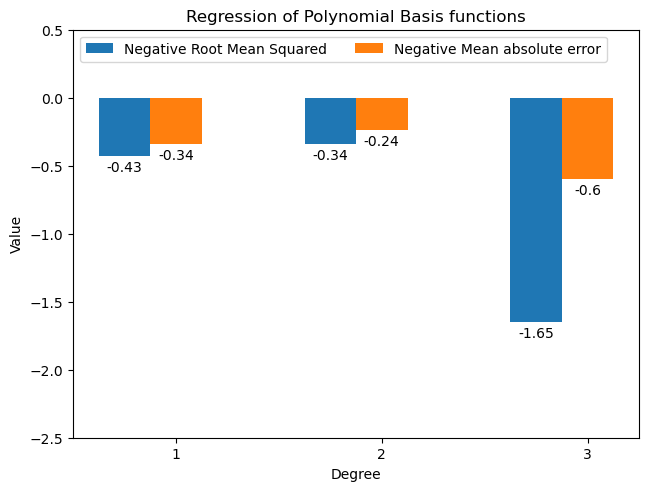

+--------------------------+---------------------+-----------------------+
| Parameters removed       |   Root Mean Squared |   Mean Absolute Error |
+==========================+=====================+=======================+
| No Params removed        |               -0.34 |                 -0.24 |
+--------------------------+---------------------+-----------------------+
| Gender                   |               -0.34 |                 -0.24 |
+--------------------------+---------------------+-----------------------+
| Age                      |               -0.34 |                 -0.24 |
+--------------------------+---------------------+-----------------------+
| Height                   |               -0.34 |                 -0.24 |
+--------------------------+---------------------+-----------------------+
| Weight                   |               -0.34 |                 -0.24 |
+--------------------------+---------------------+-----------------------+
| family_history         

In [9]:
#Plotting the linear regression data that has been pre-processed

poly_degree = ['1', '2', '3']
poly = {
    'Negative Root Mean Squared': [poly_values[0][0],poly_values[1][0],poly_values[2][0]],
    'Negative Mean absolute error': [poly_values[0][1],poly_values[1][1],poly_values[2][1]]
}
x = np.arange(len(poly_degree))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for attribute, measurement in poly.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Value')
ax.set_title('Regression of Polynomial Basis functions')
ax.set_xlabel('Degree')
ax.set_xticks(x + width, poly_degree)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(-2.5, 0.5)

plt.show()

poly_degree = []
rme = []
mae = []
data = []
headers = ['Parameters removed', 'Root Mean Squared', 'Mean Absolute Error']
table = tabulate(cat,  headers=headers, tablefmt='grid')
print(table)

<h1>SVM</h1>
Loop over gammas, kernels, regularization parameter, and scoring mechanism

For each combination, save the result in a multi index dataframe. 

<b>WARNING</b>: This next block takes ~1 hr to execute

In [10]:
# This is where you add your own models with fine tuning

models = []

gammas = ['scale', 'auto']
kernels = ['linear', 'poly_2', 'poly_3', 'rbf', 'sigmoid']
regularization_params = [0.01, 0.1, 1, 10, 100]
scorings = ['accuracy', 'neg_root_mean_squared_error', 'neg_mean_absolute_error']

results_multiIndex = pd.MultiIndex.from_product([gammas, kernels, regularization_params, scorings])
df_multiIndex = pd.DataFrame({'value': 0}, index=results_multiIndex)

for this_index in results_multiIndex:
    gamma = this_index[0]
    kernel = this_index[1]
    regularization_param = this_index[2]
    scoring = this_index[3]
    name = "SVC_" + gamma + "_" + kernel + "_" + str(regularization_param) + "_" + scoring

    if kernel == 'poly_2':
        degree = 2
        real_kernel = 'poly'
    elif kernel == 'poly_3':
        degree = 3
        real_kernel = 'poly'
    else:
        real_kernel = kernel
        degree = 0
        
    model = SVC(gamma=gamma, kernel=real_kernel, C=regularization_param, degree=degree)
    models.append((name, model))
    kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
    cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
    this_result = cv_results.mean() 
    df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result

    print(name + ": " + str(cv_results.mean()))
    
    


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result
/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.7363799661876586' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_0.01_accuracy: 0.7363799661876586


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_0.01_neg_root_mean_squared_error: -0.6008204381752142


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_0.01_neg_mean_absolute_error: -0.2967948717948718


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_0.1_accuracy: 0.8282051282051281


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_0.1_neg_root_mean_squared_error: -0.4663130165261835


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_0.1_neg_mean_absolute_error: -0.1878064243448859


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_1.0_accuracy: 0.8815194420963653


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_1.0_neg_root_mean_squared_error: -0.37921901939984776


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_1.0_neg_mean_absolute_error: -0.12736686390532545


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_10.0_accuracy: 0.9472879684418146


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_10.0_neg_root_mean_squared_error: -0.24850838960494398


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_10.0_neg_mean_absolute_error: -0.056265849535080306


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_100.0_accuracy: 0.9567695125387434


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_100.0_neg_root_mean_squared_error: -0.2136595384702515


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_linear_100.0_neg_mean_absolute_error: -0.04500563539025078


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_0.01_accuracy: 0.35603338968723586


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_0.01_neg_root_mean_squared_error: -1.115197681861486


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_0.01_neg_mean_absolute_error: -0.8364997182304874


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_0.1_accuracy: 0.5361580726965343


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_0.1_neg_root_mean_squared_error: -0.8531979463563099


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_0.1_neg_mean_absolute_error: -0.551510989010989


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_1.0_accuracy: 0.5912440123978585


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_1.0_neg_root_mean_squared_error: -0.7672352214763972


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_1.0_neg_mean_absolute_error: -0.46917089320935473


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_10.0_accuracy: 0.6706431389123696


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_10.0_neg_root_mean_squared_error: -0.6644723674847247


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_10.0_neg_mean_absolute_error: -0.36725838264299804


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_100.0_accuracy: 0.7772435897435898


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_100.0_neg_root_mean_squared_error: -0.5456021376591267


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_2_100.0_neg_mean_absolute_error: -0.24823541842772615


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_0.01_accuracy: 0.392776134122288


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_0.01_neg_root_mean_squared_error: -1.206329540121678


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_0.01_neg_mean_absolute_error: -0.8536559594251901


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_0.1_accuracy: 0.49114539306847


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_0.1_neg_root_mean_squared_error: -0.9233212336461177


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_0.1_neg_mean_absolute_error: -0.6226155255001409


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_1.0_accuracy: 0.5912404902789519


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_1.0_neg_root_mean_squared_error: -0.758060089433157


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_1.0_neg_mean_absolute_error: -0.46443716539870383


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_10.0_accuracy: 0.6854430825584672


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_10.0_neg_root_mean_squared_error: -0.6421111876638936


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_10.0_neg_mean_absolute_error: -0.3477176669484362


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_100.0_accuracy: 0.7944420963651734


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_100.0_neg_root_mean_squared_error: -0.5339017228247631


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_poly_3_100.0_neg_mean_absolute_error: -0.23281910397295014


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_0.01_accuracy: 0.1652789518174134


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_0.01_neg_root_mean_squared_error: -2.0804619351555305


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_0.01_neg_mean_absolute_error: -1.7032192166807552


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_0.1_accuracy: 0.46742040011270786


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_0.1_neg_root_mean_squared_error: -0.9698882250622256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_0.1_neg_mean_absolute_error: -0.6670646661031276


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_1.0_accuracy: 0.5752183713722177


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_1.0_neg_root_mean_squared_error: -0.8174123441543998


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_1.0_neg_mean_absolute_error: -0.5065370526908989


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_10.0_accuracy: 0.6735876303183995


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_10.0_neg_root_mean_squared_error: -0.6652579261889192


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_10.0_neg_mean_absolute_error: -0.3655043674274444


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_100.0_accuracy: 0.786147506339814


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_100.0_neg_root_mean_squared_error: -0.5303390979054374


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_rbf_100.0_neg_mean_absolute_error: -0.2369611158072696


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_0.01_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_0.01_neg_root_mean_squared_error: -2.1824319184522256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_0.01_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_0.1_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_0.1_neg_root_mean_squared_error: -2.379228070740221


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_0.1_neg_mean_absolute_error: -1.9253346012961399


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_1.0_accuracy: 0.03318188222034375


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_1.0_neg_root_mean_squared_error: -4.111313601564477


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_1.0_neg_mean_absolute_error: -3.829363905325444


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_10.0_accuracy: 0.024295576218653143


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_10.0_neg_root_mean_squared_error: -4.182099734675805


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_10.0_neg_mean_absolute_error: -3.9277155536770927


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_100.0_accuracy: 0.024292054099746406


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_100.0_neg_root_mean_squared_error: -4.24413945380339


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_scale_sigmoid_100.0_neg_mean_absolute_error: -3.9786630036630037


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_0.01_accuracy: 0.7363799661876586


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_0.01_neg_root_mean_squared_error: -0.6008204381752142


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_0.01_neg_mean_absolute_error: -0.2967948717948718


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_0.1_accuracy: 0.8282051282051281


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_0.1_neg_root_mean_squared_error: -0.4663130165261835


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_0.1_neg_mean_absolute_error: -0.1878064243448859


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_1.0_accuracy: 0.8815194420963653


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_1.0_neg_root_mean_squared_error: -0.37921901939984776


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_1.0_neg_mean_absolute_error: -0.12736686390532545


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_10.0_accuracy: 0.9472879684418146


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_10.0_neg_root_mean_squared_error: -0.24850838960494398


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_10.0_neg_mean_absolute_error: -0.056265849535080306


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_100.0_accuracy: 0.9567695125387434


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_100.0_neg_root_mean_squared_error: -0.2136595384702515


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_linear_100.0_neg_mean_absolute_error: -0.04500563539025078


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_0.01_accuracy: 0.8584072978303748


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_0.01_neg_root_mean_squared_error: -0.41998846537506507


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_0.01_neg_mean_absolute_error: -0.15344463229078614


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_0.1_accuracy: 0.9271449704142013


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_0.1_neg_root_mean_squared_error: -0.28658247412597665


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_0.1_neg_mean_absolute_error: -0.0764088475626937


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_1.0_accuracy: 0.9514194139194139


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_1.0_neg_root_mean_squared_error: -0.22888434122172882


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_1.0_neg_mean_absolute_error: -0.050355734009580155


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_10.0_accuracy: 0.9484608340377572


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_10.0_neg_root_mean_squared_error: -0.23859388808406318


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_10.0_neg_mean_absolute_error: -0.053909551986475054


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_100.0_accuracy: 0.9443188222034375


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_100.0_neg_root_mean_squared_error: -0.2547393622786484


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_2_100.0_neg_mean_absolute_error: -0.05923499577345731


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_0.01_accuracy: 0.9466821639898562


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_0.01_neg_root_mean_squared_error: -0.23547321625643808


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_0.01_neg_mean_absolute_error: -0.05450479008171316


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_0.1_accuracy: 0.9460939701324316


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_0.1_neg_root_mean_squared_error: -0.23621485152544092


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_0.1_neg_mean_absolute_error: -0.05509298393913779


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_1.0_accuracy: 0.9460939701324316


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_1.0_neg_root_mean_squared_error: -0.23621485152544092


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_1.0_neg_mean_absolute_error: -0.05509298393913779


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_10.0_accuracy: 0.9460939701324316


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_10.0_neg_root_mean_squared_error: -0.23621485152544092


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_10.0_neg_mean_absolute_error: -0.05509298393913779


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_100.0_accuracy: 0.9460939701324316


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_100.0_neg_root_mean_squared_error: -0.23621485152544092


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_poly_3_100.0_neg_mean_absolute_error: -0.05509298393913779


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_0.01_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_0.01_neg_root_mean_squared_error: -2.1824319184522256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_0.01_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_0.1_accuracy: 0.7636306001690618


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_0.1_neg_root_mean_squared_error: -0.6890281444841504


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_0.1_neg_mean_absolute_error: -0.3074457593688363


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_1.0_accuracy: 0.8951429980276135


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_1.0_neg_root_mean_squared_error: -0.4154416146598739


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_1.0_neg_mean_absolute_error: -0.12500352211890672


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_10.0_accuracy: 0.9105452240067624


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_10.0_neg_root_mean_squared_error: -0.40315308994994625


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_10.0_neg_mean_absolute_error: -0.11137996618765851


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_100.0_accuracy: 0.9081713158636235


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_100.0_neg_root_mean_squared_error: -0.4095537220537566


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_rbf_100.0_neg_mean_absolute_error: -0.11493730628346013


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_0.01_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_0.01_neg_root_mean_squared_error: -2.1824319184522256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_0.01_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_0.1_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_0.1_neg_root_mean_squared_error: -2.1824319184522256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_0.1_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_1.0_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_1.0_neg_root_mean_squared_error: -2.1824319184522256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_1.0_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_10.0_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_10.0_neg_root_mean_squared_error: -2.1824319184522256


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_10.0_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_100.0_accuracy: 0.16468723584108202


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


SVC_auto_sigmoid_100.0_neg_root_mean_squared_error: -2.1824319184522256
SVC_auto_sigmoid_100.0_neg_mean_absolute_error: -1.7902965624119471


/var/folders/qv/_v67fpcs0l33vlkg8tg1t8940000gn/T/ipykernel_67793/1841403366.py:35: PerformanceWarning: indexing past lexsort depth may impact performance.
  df_multiIndex.loc[(gamma, kernel, regularization_param, scoring), 'value'] = this_result


<h3>Print analytics</h3>
But mostly, what we want to know is the best model for each scoring function. This will be <b>THE</b> model that we will pick later in order to generate our "best-performing" confusion matrix

In [11]:
print("Maximum score for each scoring function")
print(df_multiIndex.groupby(level=[3]).idxmax())
print(df_multiIndex.groupby(level=[3]).max())

Maximum score for each scoring function
                                                                         value
accuracy                                      (scale, linear, 100.0, accuracy)
neg_mean_absolute_error        (scale, linear, 100.0, neg_mean_absolute_error)
neg_root_mean_squared_error  (scale, linear, 100.0, neg_root_mean_squared_e...
                                value
accuracy                     0.956770
neg_mean_absolute_error     -0.045006
neg_root_mean_squared_error -0.213660


<h1>SVM Plots</h1>
<h2>Average score by gamma</h2>

Compare by gamma
                                 auto     scale
accuracy                     0.727063  0.532613
neg_mean_absolute_error     -0.511281 -0.985513
neg_root_mean_squared_error -0.781176 -1.283221


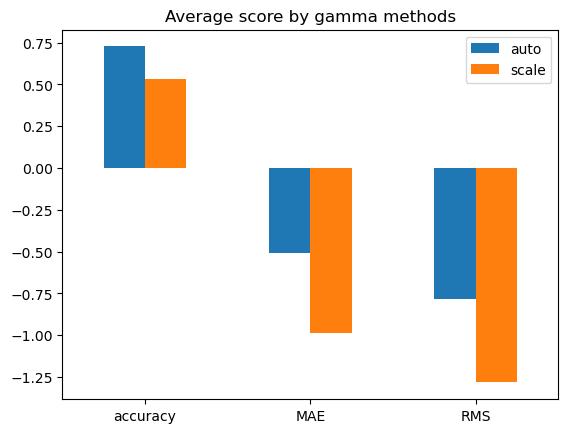

In [12]:
print("Compare by gamma")
print(df_multiIndex.groupby(level=[3,0]).mean().value.unstack())
df_multiIndex.groupby(level=[3,0]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average score by gamma methods")
plt.show()

<h2>Average score by kernel</h2>


Compare by kernels
                               linear    poly_2    poly_3       rbf   sigmoid
accuracy                     0.870032  0.756107  0.768611  0.630983  0.123458
neg_mean_absolute_error     -0.142648 -0.286603 -0.279612 -0.592835 -2.440286
neg_root_mean_squared_error -0.381704 -0.537449 -0.524406 -0.916297 -2.801137


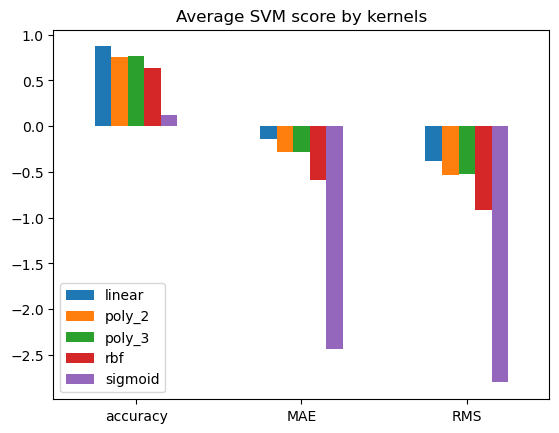

In [13]:
print("Compare by kernels")
print(df_multiIndex.groupby(level=[3,1]).mean().value.unstack())
df_multiIndex.groupby(level=[3,1]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average SVM score by kernels")
plt.show()

<h2>Average score by regularization coefficient</h2>


Compare by regularization
                               0.01      0.10      1.00      10.00     100.00
accuracy                     0.468600  0.611738  0.651127  0.691833  0.725894
neg_mean_absolute_error     -0.956580 -0.637138 -0.754499 -0.713141 -0.680625
neg_root_mean_squared_error -1.280639 -0.945252 -1.027543 -0.971135 -0.936424


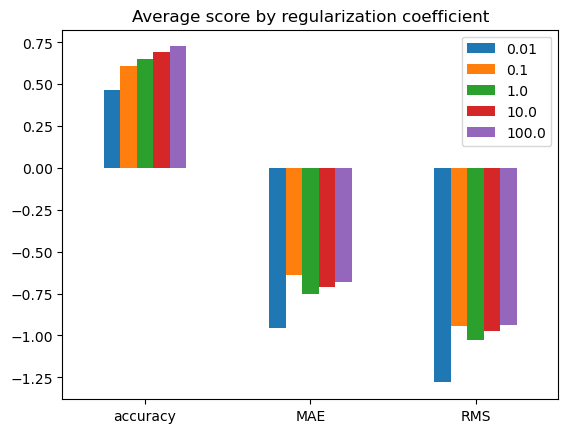

In [14]:
print("Compare by regularization")
print(df_multiIndex.groupby(level=[3,2]).mean().value.unstack())
df_multiIndex.groupby(level=[3,2]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average score by regularization coefficient")
plt.show()

<h2>Max score by gamma</h2>


Compare by gamma
                                 auto     scale
accuracy                     0.956770  0.956770
neg_mean_absolute_error     -0.045006 -0.045006
neg_root_mean_squared_error -0.213660 -0.213660


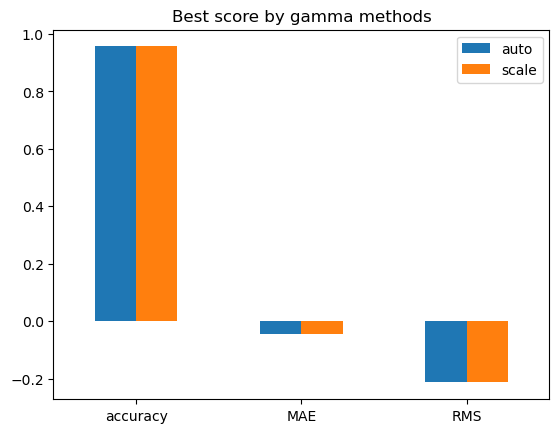

In [15]:
print("Compare by gamma")
print(df_multiIndex.groupby(level=[3,0]).max().value.unstack())
df_multiIndex.groupby(level=[3,0]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by gamma methods")
plt.show()

<h2>Max score by kernel</h2>


Compare by kernels
                               linear    poly_2    poly_3       rbf   sigmoid
accuracy                     0.956770  0.951419  0.946682  0.910545  0.164687
neg_mean_absolute_error     -0.045006 -0.050356 -0.054505 -0.111380 -1.790297
neg_root_mean_squared_error -0.213660 -0.228884 -0.235473 -0.403153 -2.182432


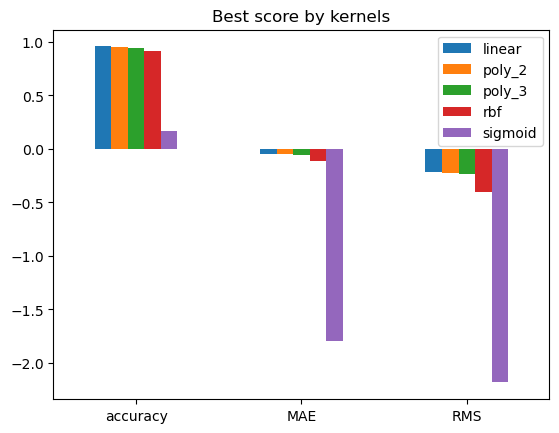

In [16]:
print("Compare by kernels")
print(df_multiIndex.groupby(level=[3,1]).max().value.unstack())
df_multiIndex.groupby(level=[3,1]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by kernels")
plt.show()

<h2>Max score by regularization</h2>


Compare by regularization
                               0.01      0.10      1.00      10.00     100.00
accuracy                     0.946682  0.946094  0.951419  0.948461  0.956770
neg_mean_absolute_error     -0.054505 -0.055093 -0.050356 -0.053910 -0.045006
neg_root_mean_squared_error -0.235473 -0.236215 -0.228884 -0.236215 -0.213660


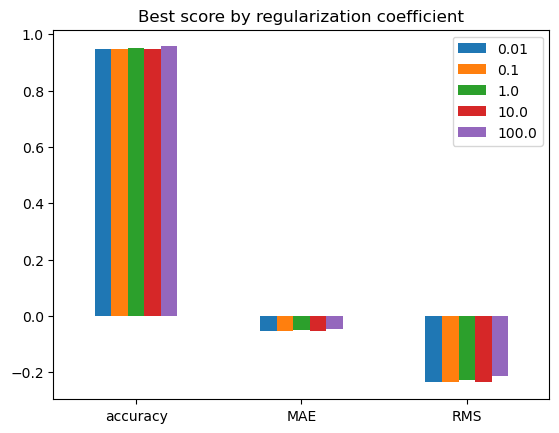

In [17]:
print("Compare by regularization")
print(df_multiIndex.groupby(level=[3,2]).max().value.unstack())
df_multiIndex.groupby(level=[3,2]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by regularization coefficient")
plt.show()

<h2>Confusion Matrix for The Best Model</h2>
Determined from a few blocks above when we printed the best performing model for each scoring category. They all happened to have the same best performing model. We will extract that particular model here and generate its confusion matrix


In [18]:
# Choose the best model:
best_model_name = 'SVC_scale_linear_100.0_neg_mean_absolute_error'
for model in models:
    if model[0] == best_model_name:
        best_model = model[1]

print(best_model)
#best_model = SVC(gamma="scale", kernel="linear", C=100)

best_model.fit(x_train, y_train)
predictions = best_model.predict(x_test)
print(accuracy_score(y_test, predictions))
print(root_mean_squared_error(y_test, predictions))
print(mean_absolute_error(y_test, predictions))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))


SVC(C=100.0, degree=0, kernel='linear')
0.9574468085106383
0.20628424925175867
0.0425531914893617
[[50  1  0  0  0  0  0]
 [ 2 51  0  0  0  0  0]
 [ 0  1 65  1  0  0  0]
 [ 0  0  4 57  0  0  0]
 [ 0  0  0  3 68  2  0]
 [ 0  0  0  0  3 49  0]
 [ 0  0  0  0  0  1 65]]
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        51
           1       0.96      0.96      0.96        53
           2       0.94      0.97      0.96        67
           3       0.93      0.93      0.93        61
           4       0.96      0.93      0.94        73
           5       0.94      0.94      0.94        52
           6       1.00      0.98      0.99        66

    accuracy                           0.96       423
   macro avg       0.96      0.96      0.96       423
weighted avg       0.96      0.96      0.96       423



Text(0.5, 1.0, 'Confusion Matrix for Scale Linear 100')

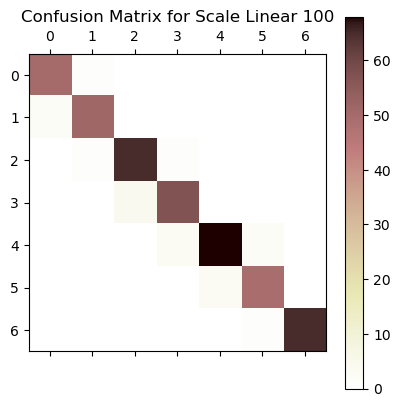

In [19]:
im = plt.matshow(confusion_matrix(y_test, predictions), cmap=plt.cm.pink_r)
plt.colorbar(im)
plt.title("Confusion Matrix for Scale Linear 100")

<h2>Extract support vectors from the training set</h2>

In [20]:
support_vectors = best_model.support_vectors_
y_support = y_train.to_numpy()[best_model.support_[:]]
x_support = x_train.to_numpy()[best_model.support_[:],:]


<h2>Plot the training data, support vectors, and testing data for every combination of features</h2>

In [21]:
def make_meshgrid(x, y, h=.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

def plot(X, Y):
    # Plot the decision boundary
    fig, ax = plt.subplots()
    
    X0, X1 = X[:, 2], X[:, 3]
    xx, yy = make_meshgrid(X0, X1)
    
    plt.scatter(X0, X1, c=Y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    plt.colorbar()
    ax.set_ylabel('Weight')
    ax.set_xlabel('Height')
    ax.set_xticks(())
    ax.set_yticks(())
    plt.show()
    
def plot_three(x_train, y_train, x_support, y_support, x_test, y_test, idx0, idx1, column0, column1):
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))  # Adjust figsize for desired width and height
    axes[0].scatter(x_train[:,idx0], x_train[:,idx1], c=y_train, cmap=plt.cm.rainbow, s=20, edgecolors='k')
    axes[0].set_title("Training Data")
    
    axes[1].scatter(x_support[:,idx0], x_support[:,idx1], c=y_support, cmap=plt.cm.rainbow, s=20, edgecolors='k')
    axes[1].set_title("Support Vectors")
    
    im = axes[2].scatter(x_test[:,idx0], x_test[:,idx1], c=y_test, cmap=plt.cm.rainbow, s=20, edgecolors='k')
    axes[2].set_title("Test Data")
    
    fig.subplots_adjust(right=0.5)
    fig.colorbar(im)
    for ax in axes.flat:
        #ax.label_outer()
        ax.set(xlabel=column0, ylabel=column1)
    plt.tight_layout()
    plt.show()




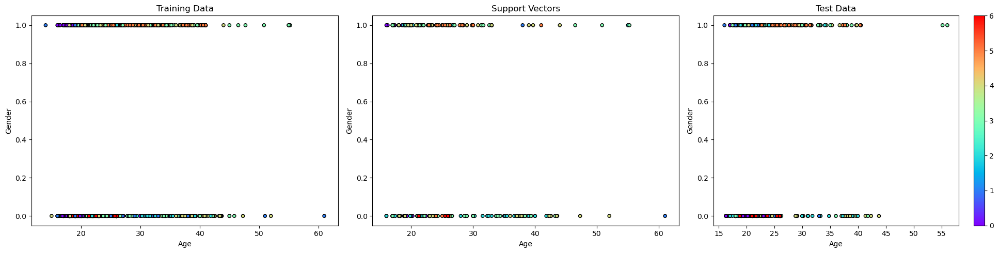

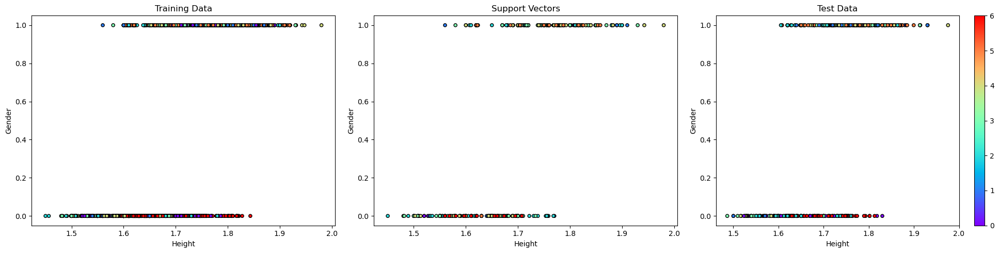

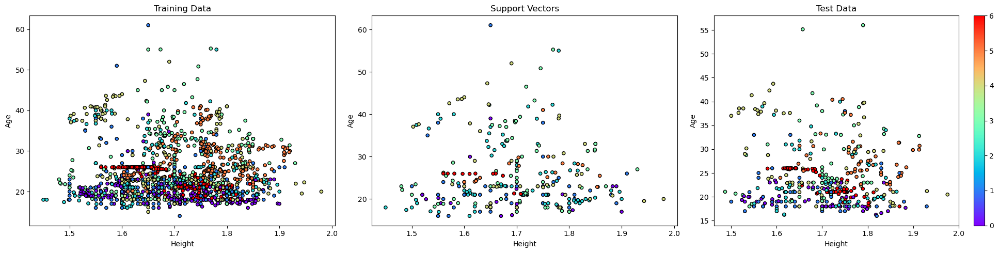

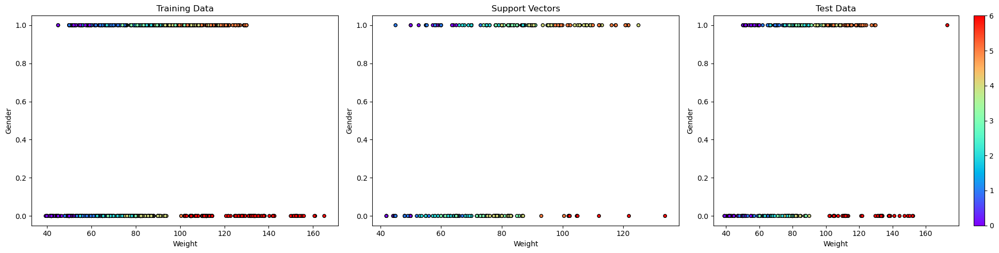

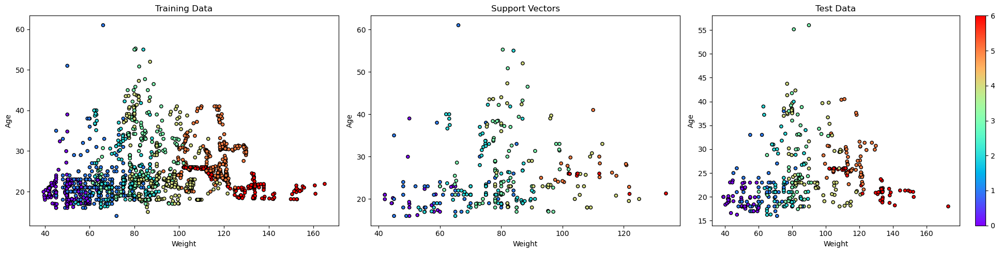

...

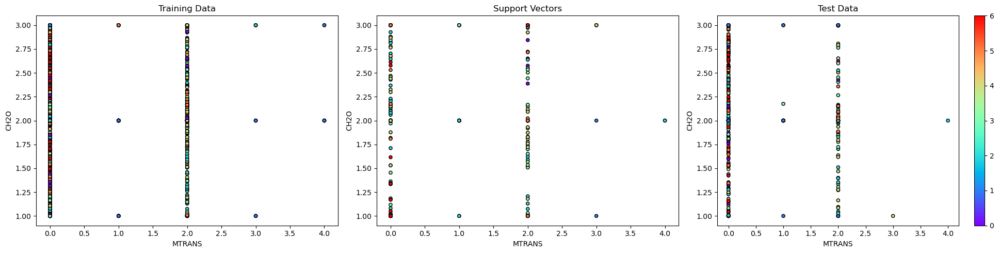

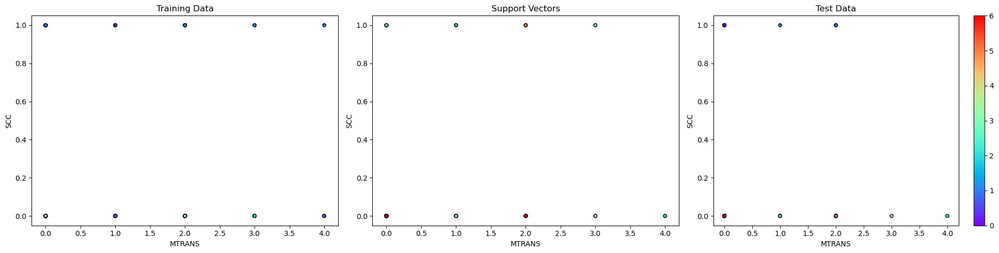

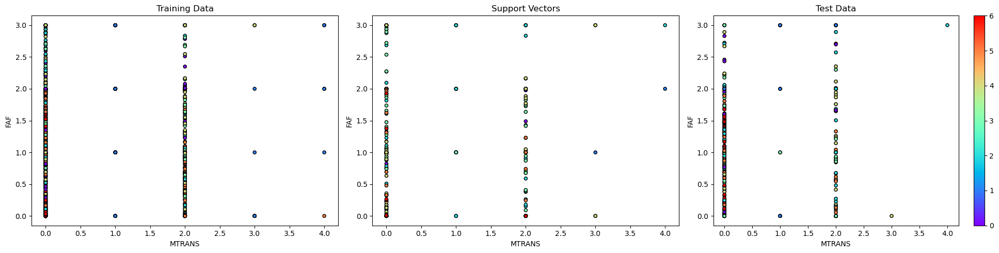

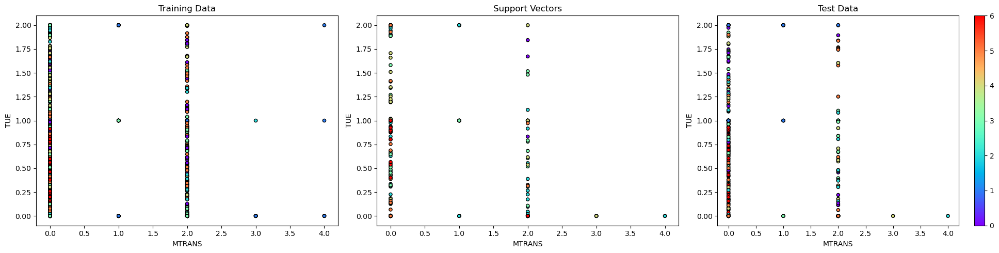

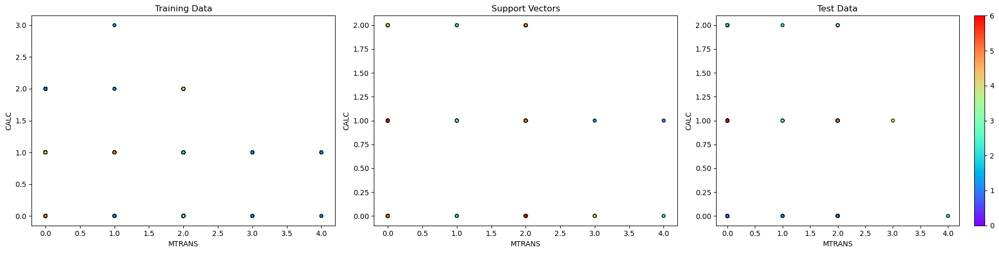

In [22]:
columns = x_train.columns.to_list()
for i in range(len(columns)):
    for j in range(i):
        column_i = columns[i]
        column_j = columns[j]
        plot_three(x_train.to_numpy(),y_train,x_support,y_support, x_test.to_numpy(),y_test,i,j,column_i,column_j)

        
        

<h1>Multi-Layer-Perceptron</h1>

<b>WARNING</b>: This block takes X minutes to run

In [ ]:
from sklearn.neural_network import MLPClassifier
import warnings
warnings.filterwarnings("ignore")

MLP_models = []

hidden_layer_sizes = [(32, 32, 32), (64, 64, 64), (128, 128, 128)]
activations = ['tanh', 'relu', 'logistic']
alphas = [0.0001, 0.05]
learning_rates = ['constant', 'adaptive']
scorings = ['accuracy', 'neg_root_mean_squared_error', 'neg_mean_absolute_error']

# Convert hidden_layer_sizes tuples to strings for the index
hidden_layer_sizes_str = [str(size).replace(" ", "") for size in hidden_layer_sizes]

results_multiIndex = pd.MultiIndex.from_product([
    hidden_layer_sizes_str, 
    activations, 
    alphas, 
    learning_rates, 
    scorings
])

MLP_multiIndex = pd.DataFrame({'value': 0}, index=results_multiIndex)

# Create a mapping from string representation to actual tuple
size_mapping = {str(size).replace(" ", ""): size for size in hidden_layer_sizes}

for this_index in results_multiIndex:
    size_str = this_index[0]
    activation = this_index[1]
    alpha = this_index[2]
    learning_rate = this_index[3]
    scoring = this_index[4]
    
    size = size_mapping[size_str]
    
    name = f"MLP_{size_str}_{activation}_{alpha}_{learning_rate}_{scoring}"
    model = MLPClassifier(hidden_layer_sizes=size, activation=activation, alpha=alpha, learning_rate=learning_rate)
    MLP_models.append((name, model))
    
    kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
    cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
    this_result = cv_results.mean()
    
    # Use the string representation for indexing
    MLP_multiIndex.loc[this_index, 'value'] = this_result
    print(f"{name}: {cv_results.mean()}")


<h2>Print the best score for each scoring function</h2>

In [ ]:
# Print more analytics here
print("Maximum score for each scoring function")
print(MLP_multiIndex.groupby(level=[4]).idxmax())
print(MLP_multiIndex.groupby(level=[4]).max())

<h3>Plot Scores Grouped By Hidden Layer Sizes</h3>

In [ ]:
print("Compare by hidden_layer_sizes")
print(MLP_multiIndex.groupby(level=[4,0]).mean().value.unstack())
MLP_multiIndex.groupby(level=[4,0]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average score by hidden_layer_sizes methods")
plt.show()

<h3>Plot Scores Grouped By Activations</h3>

In [ ]:
print("Compare by activations")
print(MLP_multiIndex.groupby(level=[4,1]).mean().value.unstack())
MLP_multiIndex.groupby(level=[4,1]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average score by activations")
plt.show()

<h3>Plot Scores Grouped By Alphas</h3>

In [ ]:
print("Compare by alphas")
print(MLP_multiIndex.groupby(level=[4,2]).mean().value.unstack())
MLP_multiIndex.groupby(level=[4,2]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average score by alphas")
plt.show()

<h3>Plot Scores Grouped By Learning Rates</h3>

In [ ]:
print("Compare by learning_rates")
print(MLP_multiIndex.groupby(level=[4,3]).mean().value.unstack())
MLP_multiIndex.groupby(level=[4,3]).mean().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Average score by learning_rates")
plt.show()

<h3>Plot Best Score Grouped By Hidden Layer Sizes</h3>

In [ ]:
print("Compare by hidden_layer_sizes")
print(MLP_multiIndex.groupby(level=[4,0]).max().value.unstack())
MLP_multiIndex.groupby(level=[4,0]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by hidden_layer_sizes methods")
plt.show()


<h3>Plot Best Score Grouped By Activations</h3>

In [ ]:
print("Compare by activations")
print(MLP_multiIndex.groupby(level=[4,1]).max().value.unstack())
MLP_multiIndex.groupby(level=[4,1]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by activation functions for MLP")
plt.show()

<h3>Plot Best Score Grouped By Alphas</h3>

In [ ]:
print("Compare by alphas")
print(MLP_multiIndex.groupby(level=[4,2]).max().value.unstack())
MLP_multiIndex.groupby(level=[4,2]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by alphas coefficient")
plt.show()

<h3>Plot Best Score Grouped By Learning Rates</h3>

In [ ]:
print("Compare by learning_rates")
print(MLP_multiIndex.groupby(level=[4,3]).max().value.unstack())
MLP_multiIndex.groupby(level=[4,3]).max().value.unstack().plot(kind='bar')
plt.xticks([0,1,2],["accuracy","MAE","RMS"], rotation=0)
plt.title("Best score by learning_rates")
plt.show()